In [ ]:
# instructions:
#figure out your parameters in the single version, parameters go in the variables minmass, maxsize and noise size
#place files in the same folder and the script will find them.
#the first block does all the tracking and it takes a while
#second graphs so you dont have to wait to track again if you want to change the plot.

In [1]:
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3

import matplotlib as mpl
import matplotlib.pyplot as plt

#this lets animations happen
%matplotlib notebook

# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 5))
mpl.rc('image', cmap='gray')

import numpy as np
import pandas as pdz
from pandas import DataFrame, Series  # for convenience
import IPython
import pims
import trackpy as tp
import av
import os

%matplotlib inline
minmass = 15
maxsize = 21
noise_size = 2

@pims.pipeline
def gray(image):
    return image[:, :, 2]  # Take just the green channel

@pims.pipeline
def crop(image,xmin,xmax,ymin,ymax):
    return image[xmin:xmax,ymin:ymax]

from os import listdir
from os.path import isfile, join, abspath, basename

try:
    path = sys.path[0]
    allfiles = [f for f in listdir(path) if isfile(join(path, f))]
    files = [ fi for fi in allfiles if fi.endswith(".avi") ]
    print("files opened succesfully")
except:
    print("oh no error opening files")

t1 =[]
filenames = []

for fl in files:
    print(abspath(fl))
    filenames.append(basename(abspath(fl)))
    frames = crop(gray(pims.Video(abspath(fl))),800,1500,800,1500)
    f = tp.batch(frames, 5, invert=True, minmass=minmass, maxsize=maxsize, noise_size=noise_size)
    t = tp.link(f, 8, memory=2) #link them together
    t1.append(tp.filter_stubs(t, 5)) #gets rid of small trajectories

Frame 499: 134 trajectories present.


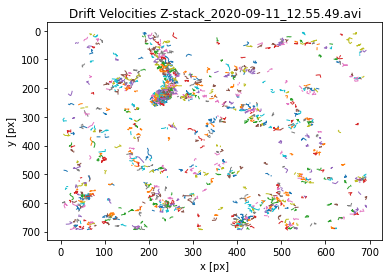

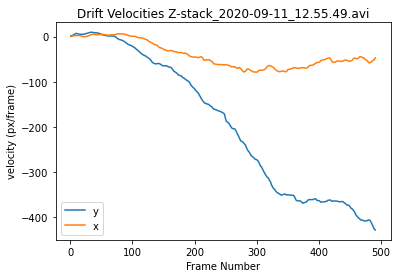

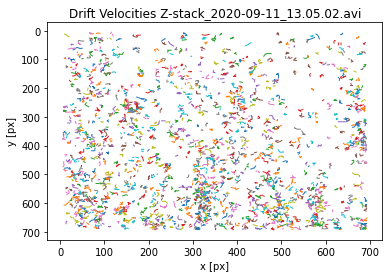

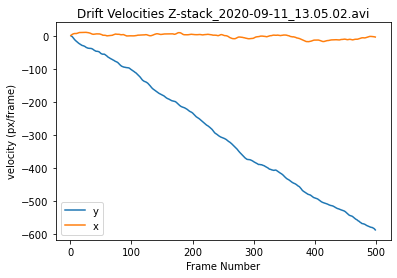

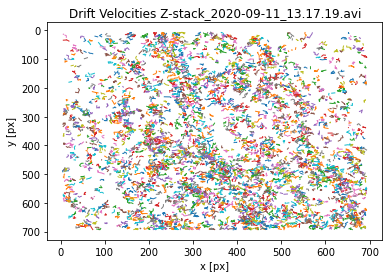

...

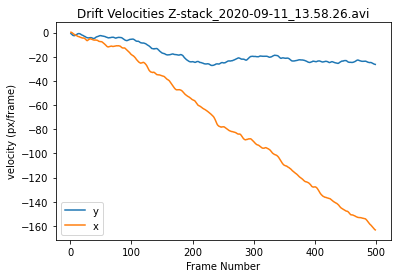

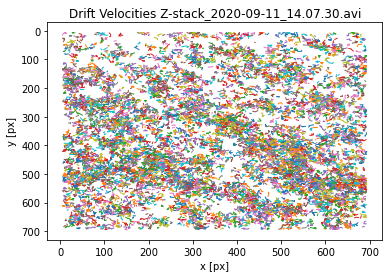

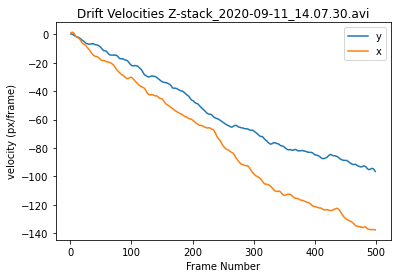

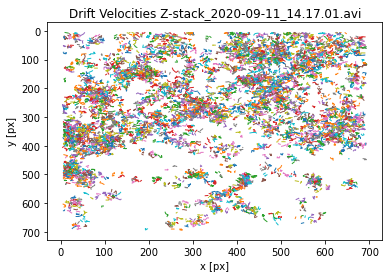

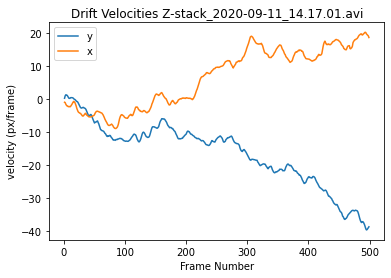

In [37]:
#makes plots
os.chdir(path)
os.mkdir("./Plots")
os.chdir("./Plots")
for i, tra in enumerate(t1):
    plt.figure()
    plt.xlabel("Frame Number")
    plt.ylabel("velocity (px/frame)")
    plt.title("Drift Velocities "+ filenames[i])
    tp.plot_traj(tra); #plotting pretty lines
#    plt.savefig("Lines "+ filenames[i]+".png", format='png') #this doesnt work bc trackpy is being weird
#    plt.show()


    d = tp.compute_drift(tra, smoothing = 5) #find drift
    d.plot()
    plt.xlabel("Frame Number")
    plt.ylabel("velocity (px/frame)")
    plt.title("Drift Velocities "+ filenames[i])
    plt.savefig("Drift Velocities "+ filenames[i]+".png", format='png')
    plt.show()